region title[markdown]
 # Gesture Recognition
 In this group project, you are going to build a 3D Conv model that will be able to predict the 5 gestures correctly. Please import the following libraries to get started.
endregion title[markdown]

In [1]:
#region import
import numpy as np
import os

# from scipy.misc import imread, imresize
# ImportError: cannot import name 'imread' from 'scipy.misc'
from scipy.ndimage import zoom
# ImportError: cannot import name 'imresize' from 'scipy.misc

import imageio
import datetime
import os

#tag user_add
import matplotlib.pyplot as plt
#endregion import

region explain_random_seed[markdown]
 We set the random seed so that the results don't vary drastically.
endregion explain_random_seed[markdown]

In [2]:
#region random_seed
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
# tf.set_random_seed(30) #AttributeError: module 'tensorflow' has no attribute 'set_random_seed
tf.random.set_seed(30)
#endregion random_seed

2024-04-02 21:07:04.930434: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# from zipfile import ZipFile
# with ZipFile('/content/drive/MyDrive/Project_data.zip','r') as zip:
#   zip.extractall('/tmp')

region explain_read_folders[markdown]
 In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.
endregion explain_read_folders[markdown]

In [4]:
#tag info # csv files contains folders' data
train_doc = np.random.permutation(open('Project_data/train.csv').readlines())
train_dir = 'Project_data/train'
val_doc = np.random.permutation(open('Project_data/val.csv').readlines())
batch_size = 10 #experiment with the batch size
#endregion read_folders

region generator_title[markdown]
 ## Generator - Sample Function
 This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.
endregion generator_title[markdown]

In [5]:
%%script echo "skipped: sample generator"
#region generator_sample
import math
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = #create a list of image numbers you want to use for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = # calculate the number of batches
        print(num_batches)
        # create empty containers for the batch
        for batch in range(math.floor(num_batches)): # we iterate over the number of batches
            batch_data = np.zeros((batch_size,x,y,z,3)) # x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB
            batch_labels = np.zeros((batch_size,5)) # batch_labels is the one hot representation of the output
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate over the frames/images of a folder to read them in
                    image = imageio(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)

                    #crop the images and resize them. Note that the images are of 2 different shape
                    #and the conv3D will throw error if the inputs in a batch have different shapes
                    #tag explain #batch_data
                    '''
                    - Use different image values for different channels => normalize each image's channel separately
                    - ":,:," means loading the image into the entire 2D space of the tensor at the specific location
                    '''
                    batch_data[folder,idx,:,:,0] = #normalise and feed in the image
                    batch_data[folder,idx,:,:,1] = #normalise and feed in the image
                    batch_data[folder,idx,:,:,2] = #normalise and feed in the image


                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels, remember what does yield do


        # write the code for the remaining data points which are left after full batches

#endregion generator_sample

skipped: sample generator


 ## Data Preparation

 ### Get all image paths

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

 #### Function

In [7]:
#region get_image_paths[function]
# get the paths to all the images in a given directory
def get_image_paths(data_dir):
    # Get a list of folder names in the data directory
    folder_names = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir,f))]
    # Create a list of paths to each folder
    folder_paths = [os.path.join(data_dir,folder_names[i]) for i in range(len(folder_names))]
    # Create a list of paths to each image
    img_paths = [os.path.join(folder_path, img) for folder_path in folder_paths for img in os.listdir(folder_path)]
    return folder_paths, img_paths
#endregion get_image_paths[function]

 #### Execution

In [8]:
#region get_train_image_paths
# Get the paths to all the images in the training directory
train_folder_paths, train_img_paths = get_image_paths(train_dir)
#endregion get_train_image_paths

 ### Get unique sizes

 #### Function: get image size

In [9]:
#region get_all_image_sizes
from PIL import Image
# Define a function to get the size of an image file
def get_image_size(img_path):
  # Open the image file
  img = Image.open(img_path)
  # Get the image dimensions
  width, height = img.size
  # Return the dimensions as a tuple
  return (height, width)

 #### Execution: get unique sizes of all images

In [10]:
# Create an empty set to store the unique image sizes
sizes = set()
# Iterate over the list of image paths
for image_path in train_img_paths:
    # Get the size of the image
    size = get_image_size(image_path)
    # Add the size to the set
    sizes.add(size)

print("Unique sizes of images: ",sizes)

#endregion get_all_image_sizes

Unique sizes of images:  {(360, 360), (120, 160)}


 ### Get unique image count per folder

In [11]:
#region uniq_frame_num
# Initialize a dictionary to store the number of images per folder
uniq_num_imgs_per_folder = set()

# Iterate through each folder path
for folder_path in train_folder_paths:
    # Get the list of image file names in the folder
    image_files = os.listdir(folder_path)

    # Add the number of images to the dictionary
    uniq_num_imgs_per_folder.add(len(image_files))

# Print the number of images per folder
print("Unique image count per folder:", uniq_num_imgs_per_folder)
#endregion uniq_frame_num

Unique image count per folder: {30}


 ### Group images by size

In [12]:
#region group_images_by_size
# Define a function to group images by size
def group_images_by_size(folder_paths):
    # Create an empty dictionary to store the grouped images
    grouped_images = {}
    # Iterate over the list of image paths
    for folder in folder_paths:
        # Get the first image from current folder
        sample_image_path = os.path.join(folder, os.listdir(folder)[0])
        # Get the size of the current image
        size = get_image_size(sample_image_path)
        # Add image to grouped images dictionary
        grouped_images.setdefault(size, []).append((sample_image_path, folder, size))

    # Return the grouped images dictionary
    return grouped_images

train_grouped_imgs = group_images_by_size(train_folder_paths)

dict_lengths = {key: len(value) for key, value in train_grouped_imgs.items()}
print("[train_grouped_imgs] Number of images for each size:", str(dict_lengths).replace('{', '').replace('}', ''))
#endregion group_images_by_size

[train_grouped_imgs] Number of images for each size: (120, 160): 479, (360, 360): 184


region init_gen_params
 ## Initializing

In [13]:
# init_gen_param
def init_gen_params(num_frames, x, y):
    # Initialize img_idx using num_frames
    img_idx = [int(num) for num in np.linspace(0,29,num_frames)]
    # Define x,y,z
    x, y, z = len(img_idx), 120, 120
    return img_idx, x, y, z
img_idx, x, y, z = init_gen_params(7, 120, 120)

print("img_idx =", img_idx)
print("x =", x)
print("y =", y)
print("z =", z)
#endregion init_gen_params

img_idx = [0, 4, 9, 14, 19, 24, 29]
x = 7
y = 120
z = 120


 ## Data Preprocessing

 ### Function: crop images to square dimensions

In [14]:
# %%

from skimage.util import crop # import to use crop() function
#region crop_image[function]
## Crop the image to a square shape with dimensions equal to the minimum of its width and height
def crop_image(origin_image, height_width):
    # If the width and height are equal, no cropping is needed
    if min(height_width) == max(height_width):
        top_bottom = left_right = (0, 0)
    else:
        # If the width is greater than the height, crop the top and bottom
        top_bottom = (int((max(height_width) - min(height_width)) / 2), int((max(height_width) - min(height_width)) / 2)) if height_width.index(max(height_width))==0 else (0, 0)
        # If the height is greater than the width, crop the left and right
        left_right = (0, 0) if height_width.index(max(height_width)) == 0 else (int((max(height_width) - min(height_width)) / 2), int((max(height_width) - min(height_width)) / 2))

    # Define the cropping dimensions
    crop_width = (top_bottom, left_right, (0,0))
    # Crop the image
    image_cropped = crop(origin_image, crop_width)
    # Return the cropped image
    return image_cropped
#endregion crop_image[function]

 ## Experiments

 ### test resize + crop

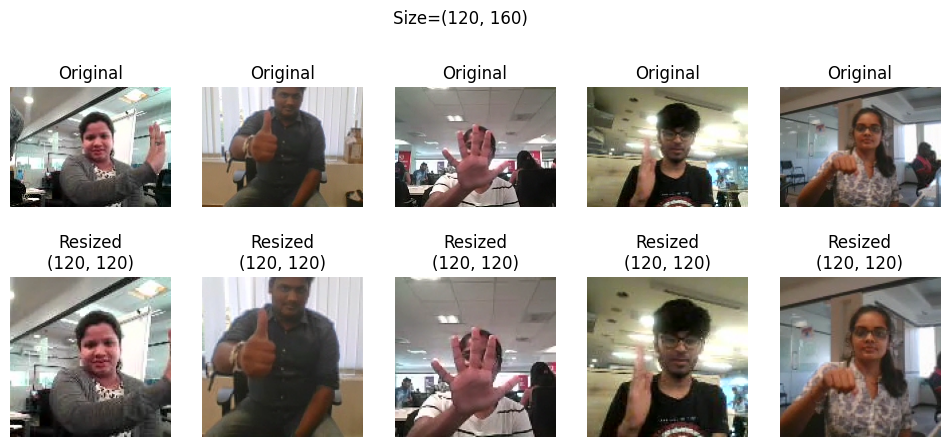

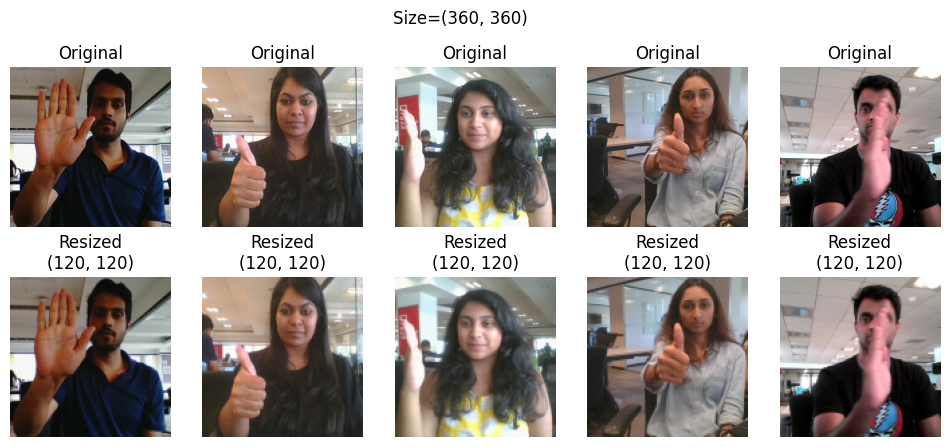

In [15]:
#region test_resize
# Test the resize and crop for both group of image sizes
from skimage.transform import resize # import to use resize() function

# Get a dictionary of 5 sample images from each group
sample_imgs_by_size = {key:values[:5] for key, values in train_grouped_imgs.items()}

# For each group of image sizes, resize and crop the first image in the group
for key, value in sample_imgs_by_size.items():
    # Initialize the figure and subplots
    fig, axs = plt.subplots(nrows=2, ncols=len(value), figsize=(12, 5))
    # Add a title to the figure
    fig.suptitle(f"Size={key}")

    # Loop through each image in the current group
    for value_idx, value in enumerate(sample_imgs_by_size[key]):

        # Display original image in the first row
        image_orig = imageio.v3.imread(value[0])
        axs[0, value_idx].imshow(image_orig)
        axs[0, value_idx].axis('off')
        axs[0, value_idx].set_title("Original")

        # Crop the resized image to a square shape
        image_cropped = crop_image(image_orig, key)
        # Resize the image
        image_resized = resize(image_cropped, (120, 120),preserve_range=True, mode='reflect')

        # Display cropped and resized image in the second row
        image_resized = image_resized/255.0
        axs[1, value_idx].imshow(image_resized)
        axs[1, value_idx].axis('off')
        axs[1, value_idx].set_title(f"Resized\n{image_resized.shape[:2]}")

    # Show the figure
    plt.show()
#endregion test_resize

 ### Test image normalization

 #### Normalization functions

In [16]:
#region test_image_normalization
import numpy as np # import to use np.clip()
random_folder = np.random.permutation(train_folder_paths)[0]
sample_imgs = sorted([os.path.join(random_folder, image_name.decode()) for image_name in os.listdir(random_folder)])
img_idx = [x-1 if x!=0 else x for x in range(0, 31, 5)]  #create a list of image numbers you want to use for a particular video
selected_imgs = [sample_imgs[idx] for idx in img_idx]

# Extract the red, green, and blue channels
def ext_rgb(image):
    image = image/255.0
    r = image[:, :, 0]
    g = image[:, :, 1]
    b = image[:, :, 2]
    return image, r, g, b

def create_img(args):
    # Create a new image with the normalized channels
    norm_image = np.zeros_like(args[0])
    norm_image[:, :, 0] = args[1]
    norm_image[:, :, 1] = args[2]
    norm_image[:, :, 2] = args[3]
    return np.clip(norm_image, 0, 1)

# inspired from https://akash0x53.github.io/blog/2013/04/29/RGB-Normalization/
def ratio_norm (args):
    # Calculate the ratio of the red, green, and blue channels
    sum_rgb = args[1] + args[2] + args[3]
    # Avoid division by zero
    sum_rgb[sum_rgb == 0] = 1

    r_norm = args[1] / sum_rgb
    g_norm = args[2] / sum_rgb
    b_norm = args[3] / sum_rgb

    return args[0], r_norm, g_norm, b_norm

# inspired from https://groups.google.com/g/comp.soft-sys.matlab/c/nXMVvJ6OhZY?pli=1
def vector_norm (args):
    # Calculate the normalized pixel intensity of the image
    pixel_vector_norm = np.sqrt(args[1]**2 + args[2]**2 + args[3]**2)
    # Avoid division by zero
    pixel_vector_norm[pixel_vector_norm==0] = 1
    # pixel_vector_norm = np.where(pixel_vector_norm == 0, 1, pixel_vector_norm)
    # Normalize the vector to have a magnitude of 1
    r_norm = args[1] / pixel_vector_norm
    g_norm = args[2] / pixel_vector_norm
    b_norm = args[3] / pixel_vector_norm

    return args[0], r_norm, g_norm, b_norm

def std_mean(args):
    # Calculate the mean and standard deviation of the red, green, and blue channels
    r_mean = np.mean(args[1])
    r_std = np.std(args[1])
    g_mean = np.mean(args[2])
    g_std = np.std(args[2])
    b_mean = np.mean(args[3])
    b_std = np.std(args[3])

    # Standardize the red, green, and blue channels
    r_std = (args[1] - r_mean) / r_std
    g_std = (args[2] - g_mean) / g_std
    b_std = (args[3] - b_mean) / b_std

    return args[0], r_std, g_std, b_std

 #### Execution

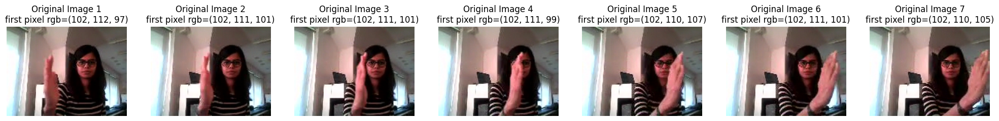

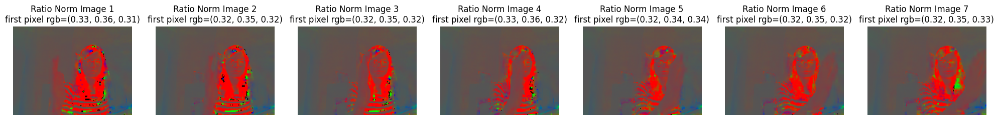

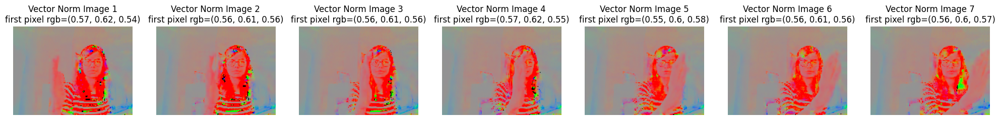

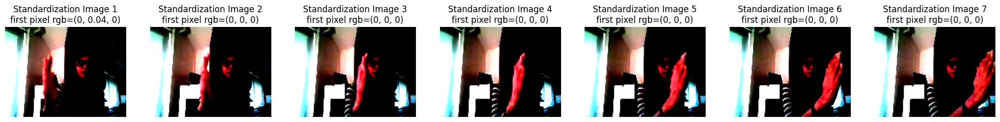

In [17]:
# Load the sample images
selected_imgs_read = [imageio.v3.imread(sample_img) for sample_img in selected_imgs]

# Test the ratio_norm function
ratio_norm_imgs = [create_img(ratio_norm(ext_rgb(img))) for img in selected_imgs_read]

# Test the vector_norm function
vector_norm_imgs = [create_img(vector_norm(ext_rgb(img))) for img in selected_imgs_read]

# Test the standardization function
std_mean_imgs = [create_img(std_mean(ext_rgb(img))) for img in selected_imgs_read]

def display_images(imgs, title):
    plt.figure(figsize=(25, 10))
    for i, img in enumerate(imgs):
        plt.subplot(1, len(imgs), i+1)
        plt.imshow(img)
        plt.title(f"{title} Image {i+1}\nfirst pixel rgb={tuple(round(v,2) if not v.is_integer() else int(v) for v in img[0,0,:3])}")
        plt.axis('off')
    plt.show()

# Display the original images
display_images(selected_imgs_read, 'Original')

# Display the ratio_norm images
display_images(ratio_norm_imgs, 'Ratio Norm')

# Display the vector_norm images
display_images(vector_norm_imgs, 'Vector Norm')

# Display the standardization images
display_images(std_mean_imgs, 'Standardization')

#endregion test_image_normalization

 ### Test remaining data points

In [18]:
#region test_remaining_data
num_full_batches = len(train_doc)//batch_size
remaining_num = len(train_doc) % batch_size
t = np.random.permutation(train_doc)

print(f"Number of full batches: {num_full_batches}")
print(f"Number of remaining images: {remaining_num}")

Number of full batches: 66
Number of remaining images: 3


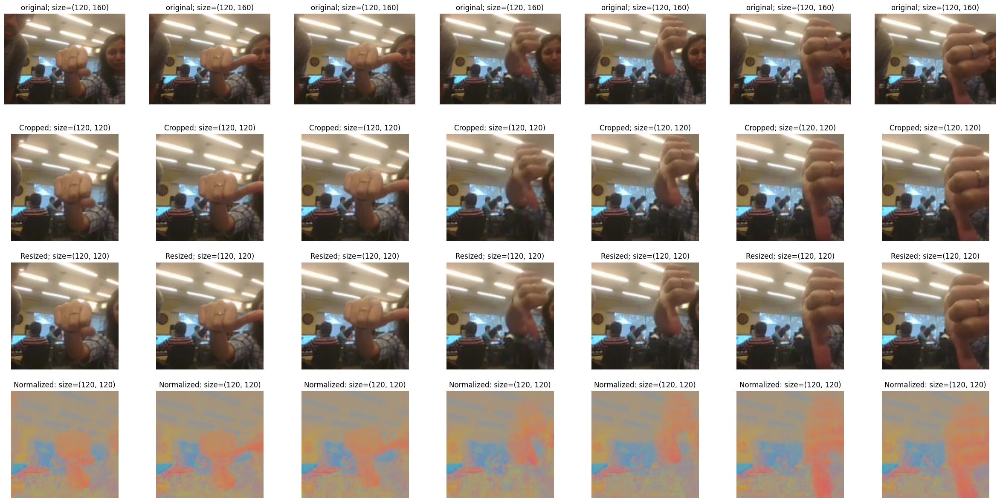

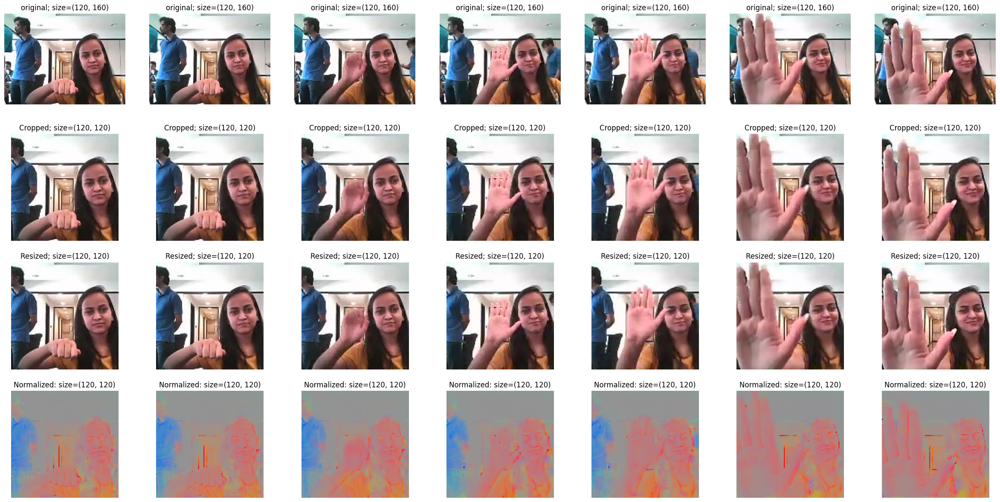

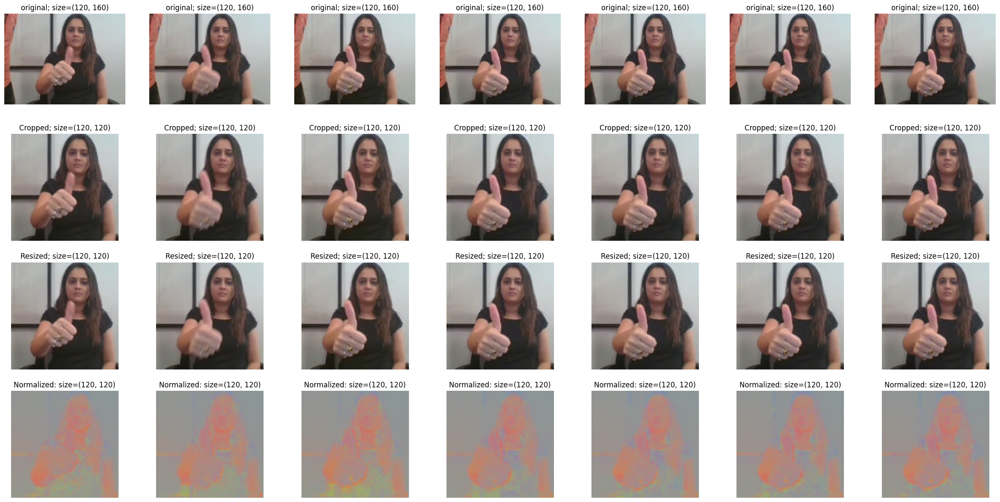

batch_labels:
 [[0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]]


In [19]:
import matplotlib.pyplot as plt # import to use plt.imshow() function
from skimage.transform import resize # import to use resize() function

batch_data = np.zeros((remaining_num,x,y,z,3))
batch_labels = np.zeros((remaining_num, 5))
for folder in range(remaining_num):
    fig, axs = plt.subplots(nrows=4, ncols=x, figsize=(30, 15))
    imgs = os.listdir(train_dir+'/'+ t[folder + (num_full_batches*batch_size)].split(';')[0]) # read all the images in the folder
    imgs = sorted(imgs)

    for idx,item in enumerate(img_idx):
        '''fig, axs = plt.subplots(ncols=2, figsize=(12, 5))'''
        image_orig = imageio.v3.imread(train_dir+'/'+t[folder + (num_full_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)

        axs[0,idx].imshow(image_orig/255)
        axs[0,idx].axis('off')
        # axs[0,idx].set_title(f"Image {imgs[item]}\nindex={item}; size={image_orig.shape[:2]}")
        axs[0,idx].set_title(f"original; size={image_orig.shape[:2]}")

        #scale image
        image_scaled = image_orig/255

        # crop the image
        image_cropped = crop_image(image_scaled, image_scaled.shape[:2])
        # display cropped image
        axs[1,idx].imshow(image_cropped)
        axs[1,idx].axis('off')
        axs[1,idx].set_title(f"Cropped; size={image_cropped.shape[:2]}")

        # resize the image
        image_resized = resize(image_cropped, (120, 120))
        # display resized image
        axs[2,idx].imshow(image_cropped)
        axs[2,idx].axis('off')
        axs[2,idx].set_title(f"Resized; size={image_resized.shape[:2]}")

        # Calculate the magnitude of the vector
        magnitude = np.sqrt(image_resized[:,:,0]**2 + image_resized[:,:,1]**2 + image_resized[:,:,2]**2)
        # Avoid division by zero
        magnitude[magnitude==0] = 1

        batch_data[folder,idx,:,:,0] = image_resized[:,:,0] / magnitude #normalise and feed in the image
        batch_data[folder,idx,:,:,1] = image_resized[:,:,1] / magnitude #normalise and feed in the image
        batch_data[folder,idx,:,:,2] = image_resized[:,:,2] / magnitude #normalise and feed in the image

        image_norm = create_img([image_resized, image_resized[:,:,0]/magnitude, image_resized[:,:,1]/magnitude, image_resized[:,:,2]/magnitude])
        axs[3,idx].imshow(image_norm)
        axs[3,idx].axis('off')
        axs[3,idx].set_title(f"Normalized: size={image_resized.shape[:2]}")
    plt.show()

    batch_labels[folder, int(t[folder + (num_full_batches*batch_size)].strip().split(';')[2])] = 1
print("batch_labels:\n", batch_labels)
#endregion test_remaining_data

 ## Final Generator

In [20]:
#region final_generator
from IPython.display import display # import to use display() function
import pandas as pd # import to use pandas.DataFrame() function
# from scipy.misc import imresize
# ImportError: cannot import name 'imresize' from 'scipy.misc' (/home/khang/.local/lib/python3.10/site-packages/scipy/misc/__init__.py)
from skimage.transform import resize # import to use resize() function

# initialize generator parameters
img_idx, x, y, z = init_gen_params(7,120,120)

def generator(source_path, folder_list, batch_size):
    print( 'Source path =', source_path, '; batch size =', batch_size)
    #tag todo # examine representative folders to determine similarities between images
    #tag todo # I think 5 would be suffice for img_idx
    # img_idx = img_idx  #create a list of image numbers you want to use for a particular video
    print("img_idx =", img_idx)
    t = np.random.permutation(folder_list)
    num_batches = len(folder_list)/batch_size # calculate the number of batches
    num_full_batches = len(folder_list)//batch_size
    #tag newly_added
    remaining_num = len(folder_list) % batch_size
    print("num_batches =", num_batches)
    # create empty containers for the batch
    for batch in range(num_full_batches): # we iterate over the number of batches
        batch_data = np.zeros((batch_size,x,y,z,3)) # x is the number of images you use for each video,(y,z) is the final size of the input images and 3 is the number of channels RGB
        batch_labels = np.zeros((batch_size,5)) # batch_labels is the one hot representation of the output
        for folder in range(batch_size): # iterate over the batch_size
            #tag explain # imgs use listdir to acquire all files (images) within the folder
            imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
            imgs = sorted(imgs)
            #tag examine # imgs
            # for i, img in enumerate(imgs):
                # display(f"Index: {i}, Image: {img}")
            #tag remove_later # display(pd.DataFrame(imgs, columns=['imgs']))
            #tag improve # img_idx = [i - 1 for i in range(0, len(imgs), 5)]
            for idx, item in enumerate (img_idx): #  Iterate over the frames/images of a folder to read them in
                image_orig = imageio.v3.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                #tag solved # Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
                # normalize the image
                # image_orig = image_orig/255

                #tag todo # crop and resize the images
                '''
                crop the images and resize them. Note that the images are of 2 different shape
                and the conv3D will throw error if the inputs in a batch have different shapes
                '''
                #scale image
                image_scaled = image_orig/255
                # crop the image
                #tag updated # add crop function
                image_cropped = crop_image(image_scaled, image_scaled.shape[:2])
                # resize the image
                image_resized = resize(image_cropped, (120, 120))

                # Calculate the normalized pixel intensity of the image
                pixel_vector_norm = np.sqrt(image_resized[:,:,0]**2 + image_resized[:,:,1]**2 + image_resized[:,:,2]**2)
                # Avoid division by zero
                pixel_vector_norm[pixel_vector_norm==0] = 1

                batch_data[folder,idx,:,:,0] = image_resized[:,:,0] / pixel_vector_norm #normalise and feed in the image
                batch_data[folder,idx,:,:,1] = image_resized[:,:,1] / pixel_vector_norm #normalise and feed in the image
                batch_data[folder,idx,:,:,2] = image_resized[:,:,2] / pixel_vector_norm #normalise and feed in the image

                #tag counter_end

            batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
        yield batch_data, batch_labels #you yield the batch_data and the batch_labels, remember what does yield do

        # handle remaining data points after full batches
    if remaining_num > 0:
        batch_data = np.zeros((remaining_num,len(img_idx),120,120,3))
        batch_labels = np.zeros((remaining_num, 5))
        for folder in range(remaining_num):
            imgs = os.listdir(source_path+'/'+ t[folder + (num_full_batches*batch_size)].split(';')[0]) # read all the images in the folder
            imgs = sorted(imgs)

            for idx,item in enumerate(img_idx):
                image_orig = imageio.v3.imread(source_path+'/'+t[folder + (num_full_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)

                #scale image
                image_scaled = image_orig/255
                # crop the image
                image_cropped = crop_image(image_scaled, image_scaled.shape[:2])
                # resize the image
                image_resized = resize(image_cropped, (120, 120))

                # Calculate the magnitude of the vector
                pixel_vector_norm = np.sqrt(image_resized[:,:,0]**2 + image_resized[:,:,1]**2 + image_resized[:,:,2]**2)
                # Avoid division by zero
                pixel_vector_norm[pixel_vector_norm==0] = 1

                batch_data[folder,idx,:,:,0] = image_resized[:,:,0] / pixel_vector_norm #normalise and feed in the image
                batch_data[folder,idx,:,:,1] = image_resized[:,:,1] / pixel_vector_norm #normalise and feed in the image
                batch_data[folder,idx,:,:,2] = image_resized[:,:,2] / pixel_vector_norm #normalise and feed in the image

            batch_labels[folder, int(t[folder + (num_full_batches*batch_size)].strip().split(';')[2])] = 1
        yield batch_data, batch_labels

### Test the Generator

In [21]:
# Test the generator function
source_path = train_dir
folder_list = train_doc
batch_size = 10

# Initialize the generator
#tag explain # folder_list is basically the data within the csv file(folder_name;gesture_name;int_value)
gen = generator(source_path, folder_list, batch_size)

# Create an empty dataframe to store batch data and labels
df = pd.DataFrame(columns=['batch_data shape', 'batch_labels shape'])

# Iterate over all batches in gen
for batch_data, batch_labels in gen:
    # Create a temporary dataframe for the current batch
    temp_df = pd.DataFrame({
        'batch_data shape': [list(batch_data.shape)],
        'batch_labels shape': [list(batch_labels.shape)],
    })

    # Append the temporary dataframe to the main dataframe
    df = pd.concat([df, temp_df], ignore_index=True)

# Display the dataframe
display(df)

Source path = Project_data/train ; batch size = 10
img_idx = [0, 4, 9, 14, 19, 24, 29]
num_batches = 66.3


,batch_data shape,batch_labels shape
0,"[10, 7, 120, 120, 3]","[10, 5]"
1,"[10, 7, 120, 120, 3]","[10, 5]"
2,"[10, 7, 120, 120, 3]","[10, 5]"
3,"[10, 7, 120, 120, 3]","[10, 5]"
4,"[10, 7, 120, 120, 3]","[10, 5]"
...,...,...
62,"[10, 7, 120, 120, 3]","[10, 5]"
63,"[10, 7, 120, 120, 3]","[10, 5]"
64,"[10, 7, 120, 120, 3]","[10, 5]"
65,"[10, 7, 120, 120, 3]","[10, 5]"


 Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

 ## Model
 Here you make the model using different functionalities that Keras provides. Remember to use `Conv3D` and `MaxPooling3D` and not `Conv2D` and `Maxpooling2D` for a 3D convolution model. You would want to use `TimeDistributed` while building a Conv2D + RNN model. Also remember that the last layer is the softmax. Design the network in such a way that the model is able to give good accuracy on the least number of parameters so that it can fit in the memory of the webcam.

## **Using Conv_3D :**

In [22]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Dropout, Flatten, BatchNormalization, Activation, Conv3D, MaxPooling3D
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import optimizers

In [36]:
curr_dt_time = datetime.datetime.now()
train_doc = train_doc
val_doc = val_doc
train_path = 'Project_data/train'
val_path =  'Project_data/val.csv'
num_train_sequences = len(train_doc)
num_val_sequences = len(val_doc)

In [38]:
# HyperParameters
num_epochs = 15 # choose the number of epochs
print ('# epochs =', num_epochs)

# input shape and num of frmaes to be picked
ImageWidth = 120
ImageHeight = 120
print("ImageWidth : ",ImageWidth)
print("ImageHeight : ",ImageHeight)


# Number of images to be used for train or validation
#tag error
# img_idx = np.arange(0,30,1)

img_idx, x, y, z = init_gen_params(7, 120, 120)
seq_len = len(img_idx)
print("seq_len : ",seq_len)

# epochs = 15
ImageWidth :  120
ImageHeight :  120
seq_len :  7


In [25]:
#write your model here
model = Sequential([
  Conv3D(16, (3,3,3), padding='same', activation='relu',input_shape=(seq_len, ImageHeight, ImageWidth, 3)),
  MaxPooling3D(pool_size=(2, 2, 2)),
  Conv3D(32, (3,3,3), padding='same', activation='relu'),
  MaxPooling3D(pool_size=(2, 2, 2)),
  Conv3D(64, (3,3,3), padding='same', activation='relu'),
  MaxPooling3D(pool_size=(2, 2, 2)),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(5, activation='softmax')
])

/home/khang/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(
2024-04-02 21:08:04.647325: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-02 21:08:04.832778: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-02 21:08:04.836245: I ext

In [26]:
optimiser = "adam" #write your optimizer
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv3d (Conv3D)                 │ (None, 30, 120, 120,   │         1,312 │
│                                 │ 16)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 15, 60, 60, 16) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 15, 60, 60, 32) │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 7, 30, 30, 32)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_2 (Conv3D)               │ (None, 7, 30, 30, 64)  │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 3, 15, 15, 64)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 43200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     5,529,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,600,901 (21.37 MB)

 Trainable params: 5,600,901 (21.37 MB)

 Non-trainable params: 0 (0.00 B)

None


In [27]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [30]:
# Model Path
model_name = 'model_cnn3D_1' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

if not os.path.exists(model_name):
    os.mkdir(model_name)

# Model File name
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.weights.h5'

# model checkpoints
# checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', save_freq = 1)
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=True, mode='auto', save_freq='epoch')

# callbacks
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2,min_lr=0.001) # write the REducelronplateau code here
callbacks_list = [checkpoint,LR]

In [31]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [39]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1,
                    callbacks=callbacks_list, validation_data=val_generator,
                    validation_steps=validation_steps, class_weight=None, initial_epoch=0)

Source path = Project_data/train ; batch size = 10
img_idx = [0, 4, 9, 14, 19, 24, 29]
num_batches = 66.3


Epoch 1/15


ValueError: Exception encountered when calling MaxPooling3D.call().

[1mNegative dimension size caused by subtracting 2 from 1 for '{{node sequential_1/max_pooling3d_2_1/MaxPool3D}} = MaxPool3D[T=DT_FLOAT, data_format="NDHWC", ksize=[1, 2, 2, 2, 1], padding="VALID", strides=[1, 2, 2, 2, 1]](sequential_1/conv3d_2_1/Relu)' with input shapes: [?,1,30,30,64].[0m

Arguments received by MaxPooling3D.call():
  • inputs=tf.Tensor(shape=(None, 1, 30, 30, 64), dtype=float32)